In [1]:
import os
import sys
import pandas as pd
import geopandas as gpd
import matplotlib
import matplotlib.pyplot as plt
from importlib import reload

In [2]:
sys.path.append("../../src")

In [3]:
import main

# Meteobikes

Meteobike data from 29th June 2022

In [4]:
mbike = pd.read_csv('/Users/lisawink/Documents/paper1/data/raw_data/ALL-SYSTEMS-2022-06-29.csv')

In [5]:
bldgs = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_buildings_3D.parquet')
streets = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_streets.parquet')
nodes = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_nodes.parquet')

# If running for the first time

In [9]:
i = 200
stn_buffers = main.buffer_stations(mbike, radius=200, input_crs='EPSG:4326', output_crs='EPSG:31468', lat_column = 'Latitude', lon_column = 'Longitude')
stn_buffers = main.neighbourhood_graph_params(bldgs, stn_buffers)
b,s,n = main.select_objects(bldgs, streets, nodes, stn_buffers)


/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py

In [10]:
stn_buffers = main.aggregate_params(b,s,n, stn_buffers)


/Users/lisawink/Documents/freiburg/src/main.py:357: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[[i+'_wmean',i+'_wstd',i+'_wmedian',i+'_wmin',i+'_wmax',i+'_wsum',i+'_wper25',i+'_wper75']] = selected_buildings.groupby('station_id')[[i,weight]].apply(weighted_stats, i, weight)
/Users/lisawink/Documents/freiburg/src/main.py:357: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[[i+'_wmean',i+'_wstd',i+'_wmedian',i+'_wmin',i+'_wmax',i+'_wsum',i+'_wper25',i+'_wper75']] = selected_buildings.groupby('station_id')[[i,weight]].apply(w

In [11]:
masked_svf_path = '/Users/lisawink/Documents/paper1/data/processed_data/SVF_street_buildings_only.tif'
stn_buffers = main.agg_raster(masked_svf_path, stn_buffers, 'SVF_3D')
stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_' + str(i) + '.parquet')

In [12]:
stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_' + str(i) + '.parquet')

In [13]:
stn_buffers

,System_ID,Time_UTC,Seconds_in_day,Altitude,Latitude,Longitude,Temperature_diff_K,Absolute_temperature_degC,Relhumidity_diff_percent,Relhumidity_percent,...,StrSCl_MAD,StrSCl_skew,StrSCl_per25,StrSCl_per75,BuCAR,SVF_3D,SVF_3D_mean,SVF_3D_std,SVF_3D_median,SVF_3D_IQR
0,1,2022-06-29T19:32:52.000Z,70371,292.1,47.993525,7.845168,0.02,24.60,8.1,64.2,...,0.038345,0.296830,0.0,0.076923,0.391041,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.644846,0.187765,0.661872,0.307998
1,1,2022-06-29T19:33:01.000Z,70381,293.6,47.993805,7.845362,-0.01,24.50,8.1,64.2,...,0.034856,0.791646,0.0,0.076923,0.388707,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.661144,0.189051,0.685670,0.310583
2,1,2022-06-29T19:33:07.000Z,70386,294.6,47.994033,7.845457,-0.01,24.50,8.1,64.2,...,0.015625,0.848364,0.0,0.076923,0.380502,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.666372,0.189356,0.693805,0.311042
3,1,2022-06-29T19:33:16.000Z,70396,294.8,47.994367,7.845562,-0.01,24.50,8.0,64.2,...,0.000000,0.527021,0.0,0.071795,0.407643,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.663862,0.192769,0.692734,0.330193
4,1,2022-06-29T19:33:44.000Z,70423,283.2,47.995337,7.845955,-0.01,24.50,8.0,64.2,...,0.000000,0.916421,0.0,0.043478,0.473701,"{'min': 0.010926200076937675, 'max': 0.9986055...",0.656308,0.195727,0.676220,0.333169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10866,99,2022-06-29T21:32:01.000Z,77521,285.3,47.992468,7.848665,0.76,21.62,2.3,73.4,...,0.000000,0.854451,0.0,0.071429,0.485506,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.543218,0.161531,0.535377,0.236000
10867,99,2022-06-29T21:32:10.000Z,77529,286.3,47.992602,7.848607,0.76,21.62,2.4,73.4,...,0.000000,0.993033,0.0,0.065126,0.487488,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.543130,0.165156,0.533139,0.238122
10868,99,2022-06-29T21:32:19.000Z,77539,288.6,47.992720,7.847900,0.76,21.62,2.4,73.4,...,0.000000,0.854451,0.0,0.071429,0.461838,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.591251,0.190346,0.573627,0.276445
10869,99,2022-06-29T21:32:44.000Z,77564,287.3,47.993572,7.845558,0.66,21.52,2.5,73.6,...,0.000000,0.858686,0.0,0.076923,0.412648,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.651427,0.190276,0.672582,0.310791


# If running again

In [6]:
stn_buffers =  gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_200.parquet')

<Axes: xlabel='StrHW_median', ylabel='Absolute_temperature_degC'>

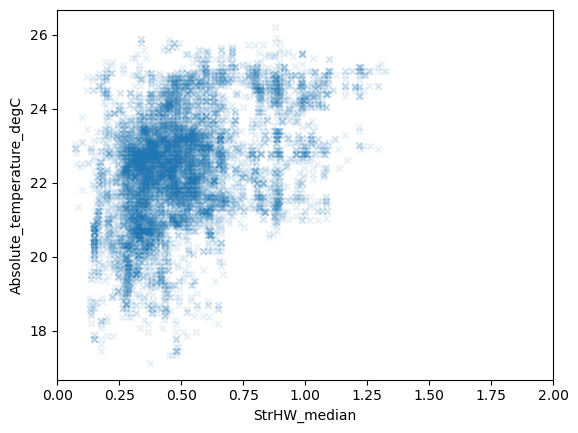

In [10]:
stn_buffers[['StrHW_median','Absolute_temperature_degC']].plot(x='StrHW_median', y='Absolute_temperature_degC', kind='scatter',marker='x',xlim=(0,2),alpha=0.1)

<Axes: xlabel='BuCAR', ylabel='Absolute_temperature_degC'>

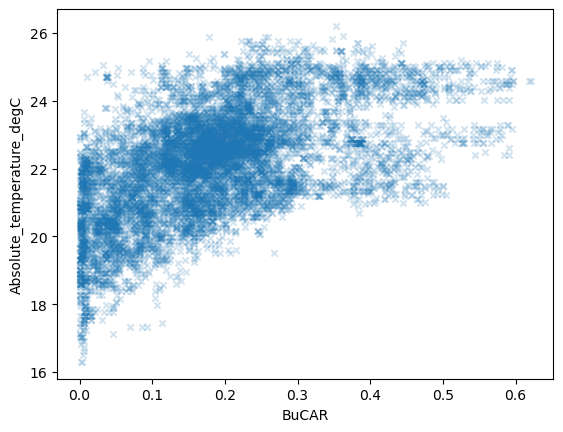

In [11]:
stn_buffers[['BuCAR','Absolute_temperature_degC']].plot(x='BuCAR', y='Absolute_temperature_degC', kind='scatter',marker='x',alpha=0.2)

<Axes: xlabel='BuIBD', ylabel='Absolute_temperature_degC'>

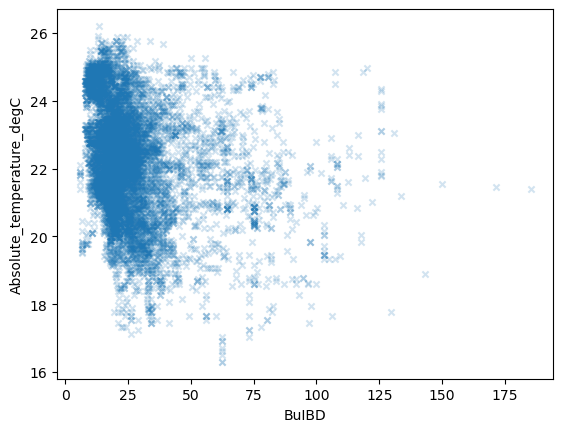

In [70]:
stn_buffers[['BuIBD','Absolute_temperature_degC']].plot(x='BuIBD', y='Absolute_temperature_degC', kind='scatter',marker='x',alpha=0.2)

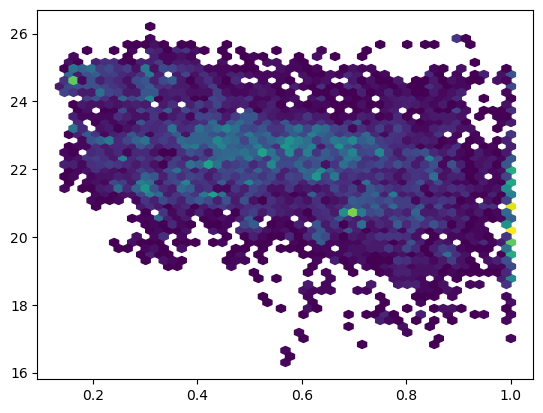

In [74]:
plt.hexbin(stn_buffers['BuAdj'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')

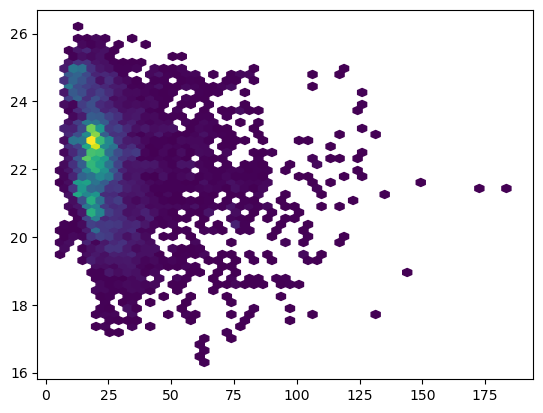

In [79]:
plt.hexbin(stn_buffers['BuIBD'].astype(float), stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')

In [78]:
stn_buffers['BuIBD'].astype(float)

0        13.409902
1        12.931618
2        12.416912
3        11.151026
4         9.619872
           ...    
10866    11.275779
10867    10.725789
10868    10.137010
10869    12.786693
10870    13.692246
Name: BuIBD, Length: 10871, dtype: float64

In [73]:
stn_buffers['Absolute_temperature_degC']

0        24.60
1        24.50
2        24.50
3        24.50
4        24.50
         ...  
10866    21.62
10867    21.62
10868    21.62
10869    21.52
10870    21.42
Name: Absolute_temperature_degC, Length: 10871, dtype: float64

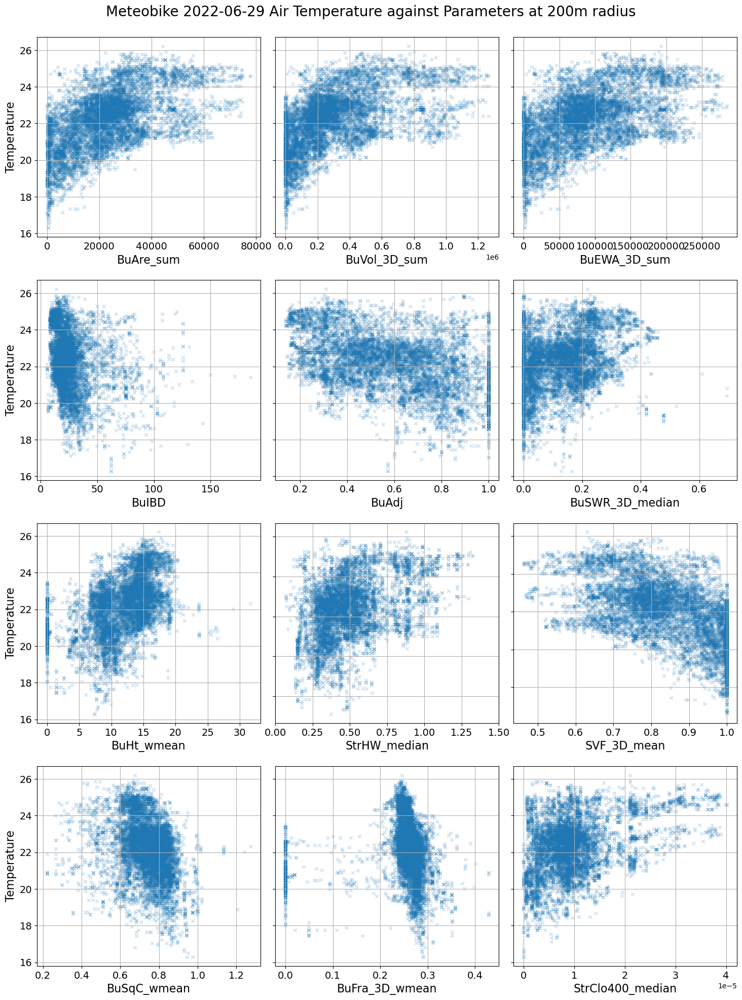

In [14]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Meteobike 2022-06-29 Air Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    if params[i] == 'StrHW_median':
        stn_buffers[['StrHW_median','Absolute_temperature_degC']].plot(x='StrHW_median', y='Absolute_temperature_degC', ax=ax, kind='scatter',marker='x',xlim=(0,1.5),alpha=0.2)
    else:
        stn_buffers[[params[i],'Absolute_temperature_degC']].plot(x=params[i], y='Absolute_temperature_degC', ax=ax, kind='scatter',marker='x',alpha=0.2)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel(params[i],fontsize=16)
    ax.set_ylabel('Temperature',fontsize=16)
    ax.grid()

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        

plt.tight_layout(pad = 2, w_pad=0.01)
plt.savefig('/Users/lisawink/Documents/paper1/figures/mbike_200m_new.png')
plt.savefig('/Users/lisawink/Documents/paper1/figures/mbike_200m_new.pdf')
plt.show()

In [97]:
# add station temp to plot

temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']
temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
temp = temp[temp['data_type'] == 'observed']
temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')

In [98]:
radius = 200
vars = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
vars.index = vars['station_id']
to_remove = ['station_id','station_no','station_name','station_long_name','station_type','station_lat','station_lon','station_elevation','mounting_structure','sky_view_factor','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF_3D']
vars = vars.drop(to_remove, axis=1)
vars = vars.merge(temp, left_on='station_id', right_on='station_id',how='inner')

In [105]:
vars['station_id'] = vars.index 

In [103]:
# Define station IDs
stations = ['FRASHA', 'FRBETZ', 'FRBRUH', 'FRDREI', 'FRFRIE', 'FRGART', 'FRGLBA',
            'FRGUNT', 'FRHAID', 'FRHBHF', 'FRHERD', 'FRHOLZ', 'FRIHOC', 'FRINST',
            'FRKART', 'FRLAND', 'FRLORE', 'FRMESS', 'FROWIE', 'FRPDAS', 'FRRIES',
            'FRSEEP', 'FRSTGA', 'FRSTGE', 'FRSTUH', 'FRUNIK', 'FRUWIE', 'FRVAUB',
            'FRWEIN', 'FRWSEE', 'FRZAHR']

# Create a colormap (e.g., using the 'tab20' color palette)
cmap = plt.get_cmap('tab20', len(stations))  # 31 unique colors
station_colors = {station: cmap(i) for i, station in enumerate(stations)}  # Map station to color


In [106]:
colors = [station_colors[station] for station in vars['station_id']]

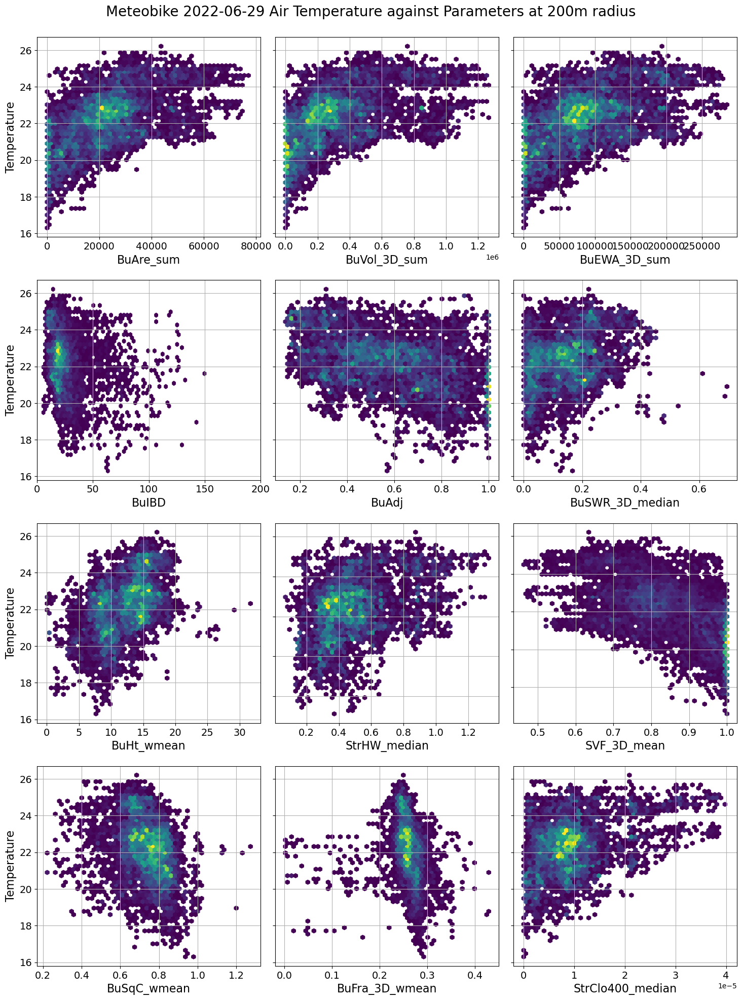

In [114]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Meteobike 2022-06-29 Air Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    if params[i] == 'BuAre_sum':
        ax.hexbin(stn_buffers['BuAre_sum'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuAre_sum (m$^2$)',fontsize=16)
    elif params[i] == 'BuVol_3D_sum':
        ax.hexbin(stn_buffers[stn_buffers['BuVol_3D_sum']!=0]['BuVol_3D_sum'], stn_buffers[stn_buffers['BuVol_3D_sum']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuVol_3D_sum (m$^3$)',fontsize=16)
    elif params[i] == 'BuEWA_3D_sum':
        ax.hexbin(stn_buffers[stn_buffers['BuEWA_3D_sum']!=0]['BuEWA_3D_sum'], stn_buffers[stn_buffers['BuEWA_3D_sum']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuEWA_3D_sum (m$^2$)',fontsize=16)
    elif params[i] == 'BuIBD':
        ax.hexbin(stn_buffers[stn_buffers['BuIBD']<150]['BuIBD'].astype(float), stn_buffers[stn_buffers['BuIBD']<150]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuIBD (m)',fontsize=16)
        ax.set_xlim(0,200)
    elif params[i] == 'BuAdj':
        ax.hexbin(stn_buffers['BuAdj'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuAdj',fontsize=16)
    elif params[i] == 'BuSWR_3D_median':
        ax.hexbin(stn_buffers[stn_buffers['BuSWR_3D_median']!=0]['BuSWR_3D_median'], stn_buffers[stn_buffers['BuSWR_3D_median']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuSWR_3D_median',fontsize=16)
    elif params[i] == 'BuHt_wmean':
        ax.hexbin(stn_buffers[stn_buffers['BuHt_wmean']!=0]['BuHt_wmean'], stn_buffers[stn_buffers['BuHt_wmean']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuHt_wmean (m)',fontsize=16)
    elif params[i] == 'StrHW_median':
        ax.hexbin(stn_buffers[stn_buffers['StrHW_median']<10]['StrHW_median'],stn_buffers[stn_buffers['StrHW_median']<10]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('StrHW_median',fontsize=16)
        #ax.set_xlim(0,1.5)
    elif params[i] == 'SVF_3D_mean':
        ax.hexbin(stn_buffers['SVF_3D_mean'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('SVF_3D_mean',fontsize=16)
    elif params[i] == 'BuSqC_wmean':
        ax.hexbin(stn_buffers['BuSqC_wmean'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('BuSqC_wmean',fontsize=16)
    elif params[i] == 'BuFra_3D_wmean':
        ax.hexbin(stn_buffers[stn_buffers['BuFra_3D_wmean']!=0]['BuFra_3D_wmean'], stn_buffers[stn_buffers['BuFra_3D_wmean']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')    
    elif params[i] == 'StrClo400_median':
        ax.hexbin(stn_buffers['StrClo400_median'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.set_xlabel('StrClo400_median',fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel(params[i],fontsize=16)
    ax.set_ylabel('Temperature',fontsize=16)
    ax.grid()

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        

plt.tight_layout(pad = 2, w_pad=0.01)
plt.savefig('/Users/lisawink/Documents/paper1/figures/mbike_200m_new.png')
plt.savefig('/Users/lisawink/Documents/paper1/figures/mbike_200m_new.pdf')
plt.show()

In [56]:
matplotlib.rc_file_defaults()

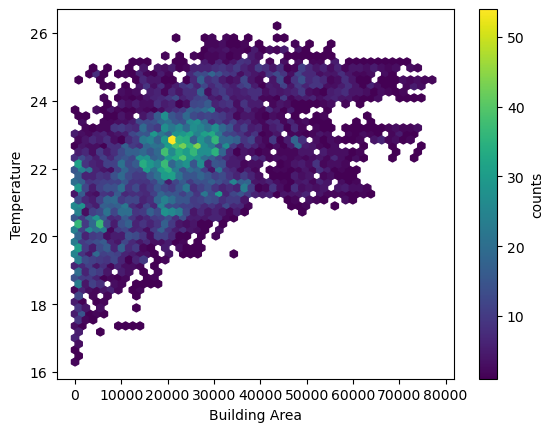

In [57]:
# create hexbin plot
fig, ax = plt.subplots()
hb = ax.hexbin(stn_buffers['BuAre_sum'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
ax.set_xlabel('Building Area')
ax.set_ylabel('Temperature')

cb = fig.colorbar(hb, ax=ax)
cb.set_label('counts')
plt.show()